Environment: velocity

In [1]:
import pandas
import scanpy
import hdf5plugin
import matplotlib
from matplotlib import pyplot
import numpy
import gseapy
import scipy
import seaborn
import scipy
import decoupler
import single_cell_analysis
from pyscenic import aucell
import warnings
import numba
import sklearn
import concurrent
import cma

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/ctxcore/__init__.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
# Scanpy plotting setup

figure_size = (5, 5)
fontsize = 14
scanpy.set_figure_params(figsize=figure_size, dpi=100, color_map="plasma", frameon=True, fontsize=fontsize)
pyplot.rcParams.update({"axes.grid": False})
pyplot.rcParams["text.usetex"] = True
latex_preamble = r"\usepackage{DejaVuSans} \renewcommand{\familydefault}{\sfdefault} \usepackage{sansmath} \sansmath"
pyplot.rcParams["text.latex.preamble"] = latex_preamble

# Suppress warnings
warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=matplotlib.MatplotlibDeprecationWarning)

In [3]:
# Load data from Cellrank and SDEvelo

working_directory = "RNA Sequencing Data/"
base_name = "cellrank"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)

adata_raw = adata.raw.to_adata()

In [4]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [5]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [6]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()

In [7]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

# Differentially expressed targets that are drivers of dead end
de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)

# Differentially expressed targets that are drivers of stem cells
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

In [8]:
variable_names = ["Hic2", "Klf4", "Myc", "Keratinocyte", "Stem cell", "Damage"]
n_variables = len(variable_names)
beta_H_index = 6

In [9]:
import numpy

parameter_configuration = {
    "alpha": {
        "names": ["alpha_H", "alpha_K", "alpha_M", "alpha_E", "alpha_S", "alpha_D"],
        "default": 0.2, "lower": 0.01, "upper": 1.0
    },
    "beta": {
        "names": ["beta_H", "beta_K", "beta_M"],
        "default": 0.2, "lower": 0.01, "upper": 1.0
    },
    "delta": {
        "names": ["delta_H", "delta_K", "delta_M", "delta_E", "delta_S", "delta_D"],
        "default": 0.2, "lower": 0.01, "upper": 1.0
    },
    "eta": {
        "names": [
            "eta_HH", 
            "eta_KK", "eta_HK", 
            "eta_MM", "eta_DM", 
            "eta_KE", "eta_EE", "eta_HE", "eta_SE", 
            "eta_KS", "eta_MS", "eta_SS", "eta_ES", "eta_DS", 
            "eta_MD", "eta_DD", "eta_HD"
        ],
        "default": 2.0, "lower": 1.0, "upper": 5.0
    },
    "kappa": {
        "names": [
            "kappa_HH", 
            "kappa_KK", "kappa_HK", 
            "kappa_MM", "kappa_DM", 
            "kappa_KE", "kappa_EE", "kappa_HE", "kappa_SE", 
            "kappa_KS", "kappa_MS", "kappa_SS", "kappa_ES", "kappa_DS", 
            "kappa_MD", "kappa_DD", "kappa_HD"
        ],
        "default": 0.5, "lower": 0.01, "upper": 1.5
    },
    "sigma": {
        "names": ["sigma_H", "sigma_K", "sigma_M", "sigma_E", "sigma_S", "sigma_D"],
        "default": 0.01, "lower": 0.001, "upper": 0.5
    }
}

parameter_names = []
default_parameters_list = []
lower_bounds_list = []
upper_bounds_list = []

for group_name, group_data in parameter_configuration.items():
    for name in group_data["names"]:
        parameter_names.append(name)
        default_parameters_list.append(group_data["default"])
        lower_bounds_list.append(group_data["lower"])
        upper_bounds_list.append(group_data["upper"])

default_parameters = numpy.array(default_parameters_list)
lower_bounds = numpy.array(lower_bounds_list)
upper_bounds = numpy.array(upper_bounds_list)
parameter_ranges = upper_bounds - lower_bounds

# Score activities

In [10]:
# Get gene sets

cell_markers = gseapy.get_library("PanglaoDB_Augmented_2021", organism="Mouse")
epithelial_markers = numpy.array(pandas.Series(cell_markers["Epithelial Cells"]).str.capitalize())
keratinocyte_markers = numpy.array(pandas.Series(cell_markers["Keratinocytes"]).str.capitalize())
stem_cell_markers = numpy.array(pandas.Series(cell_markers["Pluripotent Stem Cells"]).str.capitalize())
fibroblast_markers = numpy.array(pandas.Series(cell_markers["Fibroblasts"]).str.capitalize())
msigdb = gseapy.get_library("MSigDB_Hallmark_2020", organism="Mouse")
p53_markers = numpy.array(pandas.Series(msigdb["p53 Pathway"]).str.capitalize())

In [11]:
# Define gene signatures

dead_end_de_df = pandas.read_csv("RNA Sequencing Data/macrostate_differential_expression_Dead end.csv", index_col=0)

p53_top_1000 = numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index)

signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_top_1000
}

aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_raw.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

In [12]:
# Run AUCell

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata and adata_raw
for gene_set in result.columns:
    # Rescale
    raw_score = result[gene_set].copy()
    quantile_1 = numpy.percentile(raw_score, 1.0)
    basal_margin = 0
    shifted_score = numpy.clip(raw_score - quantile_1 + basal_margin, a_min=basal_margin, a_max=None)
    quantile_99 = numpy.percentile(shifted_score, 99.0, axis=0)
    rescaled_score = shifted_score / quantile_99
    adata.obs[f"{gene_set}_score"] = rescaled_score
    adata_raw.obs[f"{gene_set}_score"] = rescaled_score

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]

In [13]:
# Load CollecTRI database

collectri_df = decoupler.op.collectri(organism="mouse")

# Make Ovol1 weights -1
modified_collectri = collectri_df.copy()
ovol_auto_targets = modified_collectri.query("source == 'Ovol1' and sign_decision == 'default activation'").index
modified_collectri.loc[ovol_auto_targets, "weight"] = -1.0
modified_collectri.loc[ovol_auto_targets, "sign_decision"] = "manual"
# Remove unreliable signs
modified_collectri = modified_collectri.query("sign_decision != 'default activation'")
# Remove autoregulation
modified_collectri = modified_collectri.query("not (source == target)")

# Add Hic2 manually
conditions = ["Reprogramming", "MEF", "mESC", "iPSC", "Single-cell"]
lfc_columns = [f"{condition} LFC" for condition in conditions]
pval_columns = [f"{condition} p adjusted" for condition in conditions]

consistently_downregulated_df = bulk_de
for condition in conditions:
    consistently_downregulated_df = consistently_downregulated_df.query(f"`{condition} LFC` < 0")

consistently_downregulated = consistently_downregulated_df.index.to_list()
bulk_chipseq = numpy.intersect1d(consistently_downregulated, hic2_targets)
expression_df = pandas.DataFrame(data = adata.raw.X.toarray(), index=adata.obs_names, columns=adata.raw.var_names)
correlations = expression_df.drop(columns=["Hic2"]).corrwith(expression_df["Hic2"], method="pearson")
bulk_and_correlation = numpy.intersect1d(bulk_chipseq, correlations[correlations < -0.1].index)
weights = bulk_de.loc[bulk_and_correlation]["Single-cell LFC"]
hic2_network = pandas.DataFrame({"source": "Hic2", "weight": weights, "target": bulk_and_correlation, "sign_decision": "manual"})
modified_collectri = pandas.concat([modified_collectri, hic2_network])

In [14]:
# Run ULM

network_genes = ["Hic2", "Klf4", "Myc"]
decoupler.mt.ulm(adata, modified_collectri, raw=True, bsize=1000000)
network_activities = []
for gene in network_genes:
    raw_score = adata.obsm["score_ulm"][gene]
    quantile_1 = numpy.percentile(raw_score, 1.0)
    basal_margin = 0
    shifted_score = numpy.clip(raw_score - quantile_1 + basal_margin, a_min=basal_margin, a_max=None)
    quantile_99 = numpy.percentile(shifted_score, 99.0)
    rescaled_score = shifted_score / quantile_99
    adata.obs[f"{gene}_activity"] = rescaled_score
    network_activities.append(f"{gene}_activity")

# Plotting functions

In [15]:
# Function for plotting concentrations

def plot_concentrations(time_array, concentration_matrix, species_names, species_colors=None):
    n_species = concentration_matrix.shape[0]
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    figure, axis = pyplot.subplots()
    for species_index, species in enumerate(species_names):
        species_color = species_colors[species_index]
        axis.plot(time_array, concentration_matrix[species_index], label=species, color=species_color)
    axis.legend()
    axis.grid(True)
    axis.set_xlabel("Time")
    axis.set_ylabel("Concentration")
    pyplot.show()

In [16]:
# Function for plotting concentrations

def plot_trajectories(time_array, trajectories, species_names, species_colors=None, alpha=1.0, n_columns=3, figure_width=12, row_height=4):
    if len(trajectories.shape) == 2:
        trajectories = trajectories.reshape((1, trajectories.shape[0], trajectories.shape[1]))
    n_species = trajectories.shape[1]
    n_trajectories = trajectories.shape[0]
    n_time_points = len(time_array)
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for species_index, species in enumerate(species_names):
        axis = axes_flat[species_index]
        species_color = species_colors[species_index]
        for trajectory in trajectories[:, species_index].reshape((n_trajectories, n_time_points)):
            # Only plot label for one trajectory

            axis.plot(time_array, trajectory, color=species_color, alpha=alpha)
        axis.grid(True)
        axis.set_title(species)
        axis.set_xlabel("Time")
        axis.set_ylabel("Concentration")
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

# Expression trends

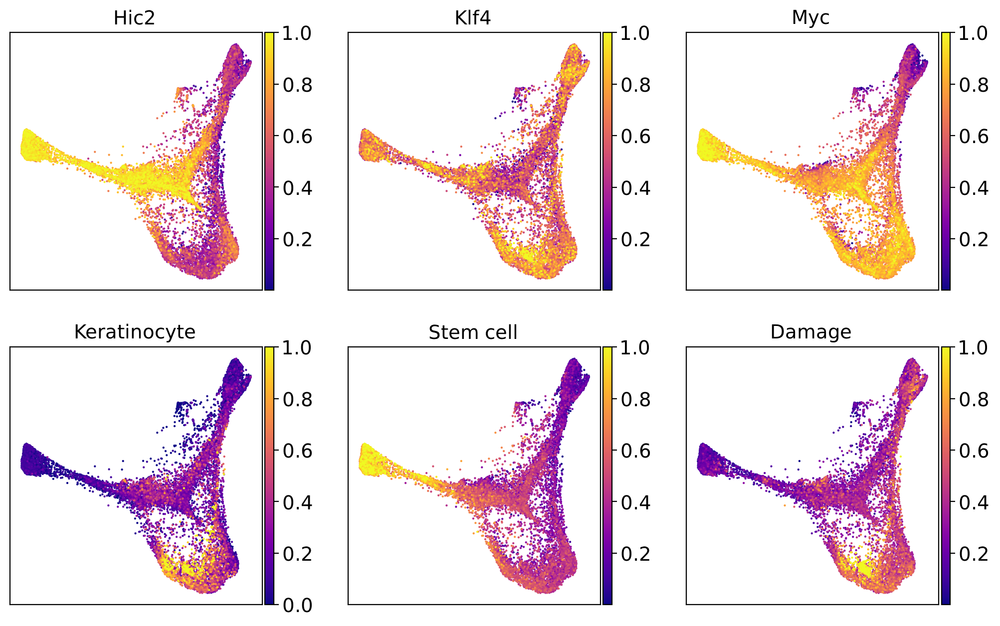

In [17]:
axes = scanpy.pl.embedding(adata, "FDL", color=network_activities+network_scores, title=variable_names, cmap="plasma",
                           vmax="p99", vmin="p1", ncols=3, show=False, wspace=0.22, hspace=0.22)
for axis in axes:
    axis.set_xlabel("")
    axis.set_ylabel("")
figure = axes[0].figure
figure.set_size_inches(12, 7)
pyplot.show()

# Functions for integrating stochastic differential equations

In [18]:
@numba.njit(nogil=True)
def derivatives_function_deterministic(time, concentrations, parameters):
    
    H = concentrations[0]
    K = concentrations[1]
    M = concentrations[2]
    E = concentrations[3]
    S = concentrations[4]
    D = concentrations[5]

    alpha_H = parameters[0]
    alpha_K = parameters[1]
    alpha_M = parameters[2]
    alpha_E = parameters[3]
    alpha_S = parameters[4]
    alpha_D = parameters[5]
    
    beta_H = parameters[6]
    beta_K = parameters[7]
    beta_M = parameters[8]
    
    delta_H = parameters[9]
    delta_K = parameters[10]
    delta_M = parameters[11]
    delta_E = parameters[12]
    delta_S = parameters[13]
    delta_D = parameters[14]
    
    eta_HH = parameters[15]
    eta_KK = parameters[16]
    eta_HK = parameters[17]
    eta_MM = parameters[18]
    eta_DM = parameters[19]
    eta_KE = parameters[20]
    eta_EE = parameters[21]
    eta_HE = parameters[22]
    eta_SE = parameters[23]
    eta_KS = parameters[24]
    eta_MS = parameters[25]
    eta_SS = parameters[26]
    eta_ES = parameters[27]
    eta_DS = parameters[28]
    eta_MD = parameters[29]
    eta_DD = parameters[30]
    eta_HD = parameters[31]
    
    kappa_HH = parameters[32]
    kappa_KK = parameters[33]
    kappa_HK = parameters[34]
    kappa_MM = parameters[35]
    kappa_DM = parameters[36]
    kappa_KE = parameters[37]
    kappa_EE = parameters[38]
    kappa_HE = parameters[39]
    kappa_SE = parameters[40]
    kappa_KS = parameters[41]
    kappa_MS = parameters[42]
    kappa_SS = parameters[43]
    kappa_ES = parameters[44]
    kappa_DS = parameters[45]
    kappa_MD = parameters[46]
    kappa_DD = parameters[47]
    kappa_HD = parameters[48]

    # precompute thermodynamic binding states for the and gate logic
    term_KS = (K / kappa_KS)**eta_KS
    term_MS = (M / kappa_MS)**eta_MS
    product_KS_MS = term_KS * term_MS

    # compute deterministic drift terms for the system
    drift_H = alpha_H * 1.0 / (1.0 + (H / kappa_HH)**eta_HH) + beta_H - delta_H * H
    
    drift_K = alpha_K * ((K / kappa_KK)**eta_KK) / (1.0 + (K / kappa_KK)**eta_KK + (H / kappa_HK)**eta_HK) + beta_K - delta_K * K
    
    drift_M = alpha_M * 1.0 / (1.0 + (M / kappa_MM)**eta_MM + (D / kappa_DM)**eta_DM) + beta_M - delta_M * M
    
    drift_E = alpha_E * ((K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE) / (1.0 + (K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE + (H / kappa_HE)**eta_HE + (S / kappa_SE)**eta_SE) - delta_E * E
    
    drift_S = alpha_S * (product_KS_MS + (S / kappa_SS)**eta_SS) / (1.0 + product_KS_MS + (S / kappa_SS)**eta_SS + (E / kappa_ES)**eta_ES + (D / kappa_DS)**eta_DS) - delta_S * S
    
    drift_D = alpha_D * ((M / kappa_MD)**eta_MD + (D / kappa_DD)**eta_DD) / (1.0 + (M / kappa_MD)**eta_MD + (D / kappa_DD)**eta_DD + (H / kappa_HD)**eta_HD) - delta_D * D

    return numpy.array([drift_H, drift_K, drift_M, drift_E, drift_S, drift_D])

In [19]:
@numba.njit(nogil=True)
def derivatives_function_stochastic(time, concentrations, dt, parameters):

    drift_terms = derivatives_function_deterministic(time, concentrations, parameters)

    drift_H = drift_terms[0]
    drift_K = drift_terms[1]
    drift_M = drift_terms[2]
    drift_E = drift_terms[3]
    drift_S = drift_terms[4]
    drift_D = drift_terms[5]

    sigma_H = parameters[-6]
    sigma_K = parameters[-5]
    sigma_M = parameters[-4]
    sigma_E = parameters[-3]
    sigma_S = parameters[-2]
    sigma_D = parameters[-1]    

    # Integrate with Euler-Maruyama
    dH = drift_H * dt + sigma_H * numpy.sqrt(dt) * numpy.random.normal()
    dK = drift_K * dt + sigma_K * numpy.sqrt(dt) * numpy.random.normal()
    dM = drift_M * dt + sigma_M * numpy.sqrt(dt) * numpy.random.normal()
    dE = drift_E * dt + sigma_E * numpy.sqrt(dt) * numpy.random.normal()
    dS = drift_S * dt + sigma_S * numpy.sqrt(dt) * numpy.random.normal()
    dD = drift_D * dt + sigma_D * numpy.sqrt(dt) * numpy.random.normal()

    return numpy.array([dH, dK, dM, dE, dS, dD])

# Define initial concentrations

In [20]:
# Get average MEF concentrations

initial_concentrations = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Myc_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].mean(),
])
print(initial_concentrations)

[0.30557836 0.51384429 0.28450118 0.04570264 0.16981907 0.25288959]


In [21]:
# List of variable values in MEFs

mef_values = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Myc_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].to_numpy(),
]).T

# Prepare for optimization

In [22]:
time_span = [0, 12]
dt = 1e-1

# extract real data and time from the anndata object

adata_hic2 = adata[adata.obs["group"] == "Hic2 OE"]
hic2_concentrations = numpy.array([
    adata_hic2.obs["Hic2_activity"].to_numpy(),
    adata_hic2.obs["Klf4_activity"].to_numpy(),
    adata_hic2.obs["Myc_activity"].to_numpy(),
    adata_hic2.obs["keratinocyte_score"].to_numpy(),
    adata_hic2.obs["stem_cell_score"].to_numpy(),
    adata_hic2.obs["p53_score"].to_numpy(),
]).T
hic2_time = adata_hic2.obs["day"].to_numpy(dtype=float)

adata_control = adata[adata.obs["group"] == "Control"]
control_concentrations = numpy.array([
    adata_control.obs["Hic2_activity"].to_numpy(),
    adata_control.obs["Klf4_activity"].to_numpy(),
    adata_control.obs["Myc_activity"].to_numpy(),
    adata_control.obs["keratinocyte_score"].to_numpy(),
    adata_control.obs["stem_cell_score"].to_numpy(),
    adata_control.obs["p53_score"].to_numpy(),
]).T
control_time = adata_control.obs["day"].to_numpy(dtype=float)

real_times = numpy.unique(control_time)

In [23]:
# Prepare for deterministic optimization

def get_means(times, concentrations):
    unique_times = numpy.unique(times)
    n_species = concentrations.shape[-1]
    mean_list = []
    for i in range(len(unique_times)):
            time = unique_times[i]
            
            time_indices = numpy.where(times == time)[0]
            concentrations_timepoint = concentrations[time_indices]
            means = numpy.mean(concentrations_timepoint, axis=0)
            mean_list.append(means)
    return numpy.array(mean_list)

hic2_mean_array = get_means(hic2_time, hic2_concentrations)
control_mean_array = get_means(control_time, control_concentrations)

@numba.njit(nogil=True)
def mse(real, simulated):
     return numpy.mean(numpy.square(numpy.subtract(real, simulated)))

def compare_deterministic(parameters, variables_names=variable_names, n_columns=3, figure_width=12, row_height=4):
    n_species = len(initial_concentrations)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for condition in ["Hic2 OE", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            color = adata.uns["group_colors"][2]
            real_concentrations = control_mean_array
        else:
            color = adata.uns["group_colors"][3]
            real_concentrations = hic2_mean_array
        result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[parameters], t_eval=time_array, rtol=1e-6)
        simulated_time = result.t
        simulated_concentrations = result.y
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            axis.plot(simulated_time, simulated_concentrations[species_index], color=color)
            axis.plot(real_times, real_concentrations[:, species_index], color=color, label=condition, linestyle="", marker="o")
            if condition == "Control":
                axis.grid(True)
                axis.set_title(species)
                axis.set_xlabel("Time")
                axis.set_ylabel("Concentration")
                axis.set_ylim([0, 1])
                if species_index == 0:
                    axis.legend()
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

def evaluate_deterministic(parameters, loss_function=mse, time_span=(0, 12), derivatives_function=derivatives_function_deterministic, rtol=1e-6):
    
    control_parameters = parameters.copy()
    control_parameters[beta_H_index] = 0 # Set beta_H to 0

    hic2_result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[parameters],
                                            t_eval=real_times, rtol=rtol)
    hic2_concentrations_simulated = hic2_result.y.T

    control_result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[control_parameters],
                                               t_eval=real_times, rtol=rtol)
    control_concentrations_simulated = control_result.y.T

    loss = loss_function(hic2_mean_array, hic2_concentrations_simulated) + loss_function(control_mean_array, control_concentrations_simulated)
    return loss

In [24]:
# Function for generating trajectories

@numba.njit(nogil=True)
def euler_maruyama(time_array, derivatives_function, initial_values,
                     negatives = True, seed=None, parameters = numpy.empty(0)):
    species = initial_values.size
    dt = time_array[1] - time_array[0]
    concentration_matrix = numpy.zeros((time_array.size, species))
    concentration_matrix[0] = initial_values
    
    if not seed is None:
        numpy.random.seed(seed)
    
    for step_index in range(1, len(time_array)):
        t = time_array[step_index]
        xi = numpy.random.normal()
        concentrations = concentration_matrix[step_index-1]
        dc = derivatives_function(t, concentrations, dt, parameters)
        if negatives:
            new_concentrations = concentrations + dc
        else:
            new_concentrations = numpy.clip(concentrations + dc, a_min=0, a_max=None)
        concentration_matrix[step_index] = new_concentrations.copy()
    return concentration_matrix.T.copy()

@numba.njit(nogil=True)
def generate_trajectories(time_span, derivatives_function, dt=1e-1,
                     seed=None, parameters = numpy.empty(0), n_trajectories=1000):
    time_array = numpy.arange(time_span[0], time_span[1]+dt, dt)
    n_time_points = len(time_array)
    n_species = len(mef_values[0])
    results = numpy.empty((n_trajectories, n_species, n_time_points))
    n_mef_cells = len(mef_values)
    if not seed is None:
        numpy.random.seed(seed)
    for i in range(n_trajectories):
        initial_cell_index = numpy.random.randint(n_mef_cells)
        initial_concentrations = mef_values[initial_cell_index]
        concentration_matrix = euler_maruyama(time_array, derivatives_function, initial_concentrations, seed=None, parameters=parameters, negatives=False)
        results[i] = concentration_matrix
    return time_array, results

In [25]:
# MMD function

@numba.njit(nogil=True)
def mmd_rbf(X, Y, bandwidths):
    n_X = X.shape[0]
    n_Y = Y.shape[0]
    n_features = X.shape[1]
    n_bandwidths = bandwidths.shape[0]

    # precompute inverse bandwidths to replace division with multiplication
    inv_two_bandwidths = numpy.zeros(n_bandwidths)
    for b in range(n_bandwidths):
        inv_two_bandwidths[b] = 1.0 / (2.0 * bandwidths[b])

    sum_XX = 0.0
    for i in range(n_X):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - X[j, k])**2
            for b in range(n_bandwidths):
                sum_XX += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_YY = 0.0
    for i in range(n_Y):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (Y[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_YY += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_XY = 0.0
    for i in range(n_X):
        for j in range(n_Y):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_XY += numpy.exp(-distance_squared * inv_two_bandwidths[b])

    mmd_squared = (sum_XX / (n_X * (n_X - 1.0))) - (2.0 * sum_XY / (n_X * n_Y)) + (sum_YY / (n_Y * (n_Y - 1.0)))
    loss = max(0.0, mmd_squared)
    return loss

@numba.njit(nogil=True)
def mmd_cost_function(time_array, trajectories, real_time, real_concentrations):
    # bandwidths = numpy.array([0.01, 0.1, 0.5, 1, 10])
    # bandwidths = numpy.array([0.5])
    bandwidths = numpy.array([0.1, 1, 5])
    
    mmd_total = 0.0
    unique_times = numpy.unique(real_time)

    for i in range(len(unique_times)):
        time = unique_times[i]
        
        real_time_indices = numpy.where(real_time == time)[0]
        real_concentrations_timepoint = real_concentrations[real_time_indices]
        
        sim_time_index = numpy.argmax(time_array == time)
        sim_data_timepoint = trajectories[:, :, sim_time_index]

        mmd_total += mmd_rbf(real_concentrations_timepoint, sim_data_timepoint, bandwidths)

    return mmd_total

In [26]:
# Function for evaluating parameters

@numba.njit(nogil=True)
def evaluate_parameters(parameters, loss_function=mmd_cost_function, time_span=(0, 12), derivatives_function=derivatives_function_stochastic, n_trajectories=500, seed=0, dt=1e-1):
    # Run Hic2 simulation
    time_array, hic2_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
    # Run control simulation
    control_parameters = parameters.copy()
    control_parameters[beta_H_index] = 0 # Set beta_H to 0
    time_array, control_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=control_parameters, n_trajectories=n_trajectories)

    hic2_loss = loss_function(time_array, hic2_results, hic2_time, hic2_concentrations)
    control_loss = loss_function(time_array, control_results, control_time, control_concentrations)
    loss = hic2_loss + control_loss

    return loss

In [27]:
# Functions for visualizing how well parameters fit the data

simulatcontrol_simulated_colored_color = "#df8b2b"
hic2_simulated_color = "#29cadf"

control_simulated_color = "#fda828"
hic2_simulated_color = "#1cfdfd"

def compare_stochastic_trajectories(parameters, alpha=0.3, n_columns=3, figure_width=12, row_height=4, n_trajectories=30, dt=1e-1, seed=0):
    n_species = len(initial_concentrations)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            color = adata.uns["group_colors"][2]
        else:
            color = adata.uns["group_colors"][3]
        time_array = numpy.arange(time_span[0], time_span[1]+dt, dt)
        result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[parameters], t_eval=time_array, rtol=1e-6)
        deterministic_time = result.t
        deterministic_concentrations = result.y
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
        seed += 1
        n_time_points = len(simulated_time)
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            for trajectory in simulated_concentrations[:, species_index].reshape((n_trajectories, n_time_points)):
                axis.plot(time_array, trajectory, color=color, alpha=alpha)
            axis.plot(deterministic_time, deterministic_concentrations[species_index], color=color)
            if condition == "Control":
                axis.set_ylim([0, 1])
                axis.grid(True)
                axis.set_title(species)
                axis.set_xlabel("Time")
                axis.set_ylabel("Concentration")
                if species_index == 0:
                    axis.legend()

    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            color = adata.uns["group_colors"][2]
            real_concentrations = control_mean_array
        else:
            color = adata.uns["group_colors"][3]
            real_concentrations = hic2_mean_array
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            axis.plot(real_times, real_concentrations[:, species_index], color=color, label=condition, linestyle="", marker="o", markeredgecolor="black")
            if condition == "Control":
                axis.set_ylim([0, 1])
                axis.grid(True)
                axis.set_title(species)
                axis.set_xlabel("Time")
                axis.set_ylabel("Concentration")
                if species_index == 0:
                    axis.legend()
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

def compare_pca(parameters, n_trajectories=500, seed=0, dt=1e-1, n_columns=3, figure_width=12, row_height=4):
    n_times = len(real_times)
    n_columns = min(n_columns, n_times)
    n_rows = (n_times + n_columns - 1) // n_columns
    
    figure, axes = pyplot.subplots(n_rows, n_columns, figsize=(figure_width, row_height * n_rows + 1.5))
    if n_times == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
        
    all_real = numpy.concatenate([hic2_concentrations, control_concentrations])
    simulated_point_dicts = {}
    
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
            
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
        point_dict = {}

        for time in real_times:
            real_time_indices = simulated_time == time
            simulated_points = numpy.moveaxis(simulated_concentrations[:, :, real_time_indices], 1, 2).reshape(-1, n_variables)
            point_dict[time] = simulated_points
        
        simulated_point_dicts[condition] = point_dict
        
    all_simulated = numpy.concatenate(list(simulated_point_dicts["Control"].values()) + list(simulated_point_dicts["Hic2 OX"].values()))
    all_points = numpy.concatenate([all_real, all_simulated])

    pca = sklearn.decomposition.PCA(n_components=2)
    pca.fit(all_points)

    legend_handles = []
    legend_labels = []

    for time_index, time in enumerate(real_times):
        axis = axes_flat[time_index]
        
        x_combined = []
        y_combined = []
        colors_combined = []
        
        for condition in ["Hic2 OX", "Control"]:
            if condition == "Control":
                simulated_color = control_simulated_color
                real_color = adata.uns["group_colors"][2]
                real_points = control_concentrations
                real_time_array = control_time
            else:
                simulated_color = hic2_simulated_color
                real_color = adata.uns["group_colors"][3]
                real_points = hic2_concentrations
                real_time_array = hic2_time

            simulated_pca = pca.transform(simulated_point_dicts[condition][time])
            real_pca = pca.transform(real_points[real_time_array == time])
            
            x_combined.extend(simulated_pca[:, 0])
            y_combined.extend(simulated_pca[:, 1])
            colors_combined.extend([simulated_color] * len(simulated_pca))
            
            x_combined.extend(real_pca[:, 0])
            y_combined.extend(real_pca[:, 1])
            colors_combined.extend([real_color] * len(real_pca))
            
            if time_index == 0:
                handle_sim = axis.scatter([], [], color=simulated_color, s=50, marker="o")
                handle_real = axis.scatter([], [], color=real_color, s=50, marker="o")
                legend_handles.extend([handle_real, handle_sim])
                legend_labels.extend([f"{condition} real", f"{condition} simulated"])

        x_combined = numpy.array(x_combined)
        y_combined = numpy.array(y_combined)
        colors_combined = numpy.array(colors_combined)
        
        numpy.random.seed(seed + time_index)
        shuffle_indices = numpy.random.permutation(len(x_combined))
        
        axis.scatter(x_combined[shuffle_indices], y_combined[shuffle_indices], c=colors_combined[shuffle_indices], s=10, marker=".")
        
        axis.set_xlabel("Principal component 1")
        axis.set_ylabel("Principal component 2")
        axis.set_title(f"Day {time:.0f}")
        axis.set_xlim([-1, 1])
        axis.set_ylim([-1, 1])

    for i in range(n_times, len(axes_flat)):
        axes_flat[i].axis("off")

    # Place the global legend at the top center of the figure
    figure.legend(legend_handles, legend_labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.95), frameon=False)
    
    # Adjust layout to prevent the subplots from overlapping the legend
    pyplot.tight_layout(rect=[0, 0, 1, 0.92])
    pyplot.show()

def compare_2d(parameters, n_trajectories=500, seed=0, dt=1e-1, n_columns=4, figure_width=12, row_height=3):
    n_plots = int(n_variables * (n_variables-1) / 2)
    n_columns = min(n_columns, n_plots)
    n_rows = (n_plots + n_columns - 1) // n_columns
    
    figure, axes = pyplot.subplots(n_rows, n_columns, figsize=(figure_width, row_height * n_rows + 1.5))
    if n_plots == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    simulated_dict = {}
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            parameters = parameters.copy()
            parameters[beta_H_index] = 0
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
        real_time_indices = [time in real_times for time in simulated_time]
        simulated_dict[condition] = numpy.moveaxis(simulated_concentrations[:, :, real_time_indices], 1, 2).reshape(-1, n_variables)

    legend_handles = []
    legend_labels = []

    axis_index = 0
    for variable_1 in range(n_variables):
        for variable_2 in range(variable_1+1, n_variables):
            axis = axes_flat[axis_index]
            
            x_combined = []
            y_combined = []
            colors_combined = []
            
            for condition in ["Hic2 OX", "Control"]:
                if condition == "Control":
                    real_color = adata.uns["group_colors"][2]
                    simulated_color = control_simulated_color
                    real_points = control_concentrations
                else:
                    real_color = adata.uns["group_colors"][3]
                    simulated_color = hic2_simulated_color
                    real_points = hic2_concentrations
                
                simulated_points = simulated_dict[condition]
                
                x_combined.extend(simulated_points[:, variable_1])
                y_combined.extend(simulated_points[:, variable_2])
                colors_combined.extend([simulated_color] * len(simulated_points))
                
                x_combined.extend(real_points[:, variable_1])
                y_combined.extend(real_points[:, variable_2])
                colors_combined.extend([real_color] * len(real_points))
                
                if axis_index == 0:
                    handle_sim = axis.scatter([], [], color=simulated_color, s=50, marker="o")
                    handle_real = axis.scatter([], [], color=real_color, s=50, marker="o")
                    legend_handles.extend([handle_real, handle_sim])
                    legend_labels.extend([f"{condition} real", f"{condition} simulated"])
            
            x_combined = numpy.array(x_combined)
            y_combined = numpy.array(y_combined)
            colors_combined = numpy.array(colors_combined)
            
            numpy.random.seed(seed)
            shuffle_indices = numpy.random.permutation(len(x_combined))
            
            axis.scatter(x_combined[shuffle_indices], y_combined[shuffle_indices], c=colors_combined[shuffle_indices], s=10, marker=".")
            
            axis.set_xlabel(variable_names[variable_1])
            axis.set_ylabel(variable_names[variable_2])
            axis.set_xlim([0, 1.2])
            axis.set_ylim([0, 1.2])
            axis_index += 1

    for i in range(n_plots, len(axes_flat)):
        axes_flat[i].axis("off")

    figure.legend(legend_handles, legend_labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.95), frameon=False)
    
    pyplot.tight_layout(rect=[0, 0, 1, 0.92])
    pyplot.show()

def compare_violin(parameters, alpha=0.5, n_columns=3, figure_width=12, row_height=4, n_trajectories=1000, dt=1e-1, seed=0, quantiles=None):
    n_species = len(initial_concentrations)
    n_time_points = len(real_times)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns, figsize=(figure_width, row_height * n_rows + 1.5))
    
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    simulated_point_dicts = {}
    
    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            current_parameters = parameters.copy()
            current_parameters[beta_H_index] = 0.0
        else:
            current_parameters = parameters.copy()
            
        simulated_time, simulated_concentrations = generate_trajectories(time_span, derivatives_function_stochastic, dt, seed,
                                                                         parameters=current_parameters, n_trajectories=n_trajectories)
        point_dict = {}

        for time in real_times:
            real_time_indices = simulated_time == time
            simulated_points = numpy.moveaxis(simulated_concentrations[:, :, real_time_indices], 1, 2).reshape(-1, n_variables)
            point_dict[time] = simulated_points
        
        simulated_point_dicts[condition] = point_dict

    # calculate the maximum density for each species to normalize violin widths
    # this ensures that distributions with higher variance do not appear artificially large
    max_densities_per_species = {index: 0.0 for index in range(n_species)}
    condition_densities = {"Hic2 OX": {"real": {}, "simulated": {}}, "Control": {"real": {}, "simulated": {}}}

    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            real_points = control_concentrations
            real_time_array = control_time
        else:
            real_points = hic2_concentrations
            real_time_array = hic2_time

        for species_index in range(n_species):
            condition_densities[condition]["real"][species_index] = []
            condition_densities[condition]["simulated"][species_index] = []

            for time in real_times:
                # evaluate real distribution density
                real_distribution = real_points[real_time_array == time, species_index]
                real_distribution = real_distribution[~numpy.isnan(real_distribution)]
                
                if len(real_distribution) > 1 and numpy.var(real_distribution) > 0:
                    real_kde = scipy.stats.gaussian_kde(real_distribution)
                    y_eval_real = numpy.linspace(min(real_distribution), max(real_distribution), 100)
                    real_max_density = real_kde.evaluate(y_eval_real).max()
                else:
                    real_max_density = 0.0

                condition_densities[condition]["real"][species_index].append(real_max_density)
                if real_max_density > max_densities_per_species[species_index]:
                    max_densities_per_species[species_index] = real_max_density

                # evaluate simulated distribution density
                simulated_distribution = simulated_point_dicts[condition][time][:, species_index]
                simulated_distribution = simulated_distribution[~numpy.isnan(simulated_distribution)]
                
                if len(simulated_distribution) > 1 and numpy.var(simulated_distribution) > 0:
                    simulated_kde = scipy.stats.gaussian_kde(simulated_distribution)
                    y_eval_sim = numpy.linspace(min(simulated_distribution), max(simulated_distribution), 100)
                    simulated_max_density = simulated_kde.evaluate(y_eval_sim).max()
                else:
                    simulated_max_density = 0.0

                condition_densities[condition]["simulated"][species_index].append(simulated_max_density)
                if simulated_max_density > max_densities_per_species[species_index]:
                    max_densities_per_species[species_index] = simulated_max_density

    legend_handles = []
    legend_labels = []

    for condition in ["Hic2 OX", "Control"]:
        if condition == "Control":
            simulated_color = control_simulated_color
            real_color = adata.uns["group_colors"][2]
            real_points = control_concentrations
            real_time_array = control_time
            side = "high"
        else:
            simulated_color = hic2_simulated_color
            real_color = adata.uns["group_colors"][3]
            real_points = hic2_concentrations
            real_time_array = hic2_time
            side = "low"
            
        for species_index, species in enumerate(variable_names):
            axis = axes_flat[species_index]
            real_distributions = []
            simulated_distributions = []
            
            for time in real_times:
                real_distribution = real_points[real_time_array == time, species_index]
                real_distributions.append(real_distribution)
                simulated_distribution = simulated_point_dicts[condition][time][:, species_index]
                simulated_distributions.append(simulated_distribution)
                
            violin_width = 0.95
            violin_positions = numpy.array(range(n_time_points))
            violin_offset = 0.0
            
            # calculate relative widths based on the maximum density to enforce equal area
            global_max = max_densities_per_species[species_index]
            if global_max > 0:
                real_widths = [violin_width * (d / global_max) for d in condition_densities[condition]["real"][species_index]]
                simulated_widths = [violin_width * (d / global_max) for d in condition_densities[condition]["simulated"][species_index]]
            else:
                real_widths = [violin_width] * n_time_points
                simulated_widths = [violin_width] * n_time_points

            # safeguard against zero variance distributions collapsing the violin entirely
            real_widths = [max(w, 0.05) for w in real_widths]
            simulated_widths = [max(w, 0.05) for w in simulated_widths]

            if not quantiles is None:
                current_quantiles = [quantiles] * n_time_points
            else:
                current_quantiles = None

            real_violin = axis.violinplot(real_distributions, positions=violin_positions - violin_offset, widths=real_widths,
                                          quantiles=current_quantiles, showextrema=False, side=side)
            simulated_violin = axis.violinplot(simulated_distributions, positions=violin_positions + violin_offset, widths=simulated_widths,
                                               quantiles=current_quantiles, showextrema=False, side=side)
            
            for shape in real_violin["bodies"]:
                shape.set_color(real_color)
                shape.set_alpha(alpha)
                shape.set_edgecolor("black")
                
            for shape in simulated_violin["bodies"]:
                shape.set_color(simulated_color)
                shape.set_alpha(alpha)
                shape.set_edgecolor("black")
                
            if not quantiles is None:
                real_violin["cquantiles"].set_color(real_color)
                simulated_violin["cquantiles"].set_color(simulated_color)
            
            axis.set_xticks(violin_positions, labels=real_times)
            axis.grid(True)
            axis.set_title(variable_names[species_index])
            axis.set_xlabel("Day")
            axis.set_ylabel("Value")
            axis.set_ylim([0, 1.2])

            if species_index == 0:
                handle_sim = axis.scatter([], [], color=simulated_color, s=50, marker="o")
                handle_real = axis.scatter([], [], color=real_color, s=50, marker="o")
                legend_handles.extend([handle_real, handle_sim])
                legend_labels.extend([f"{condition} real", f"{condition} simulated"])
                    
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)

    figure.legend(legend_handles, legend_labels, loc="upper center", ncol=4, bbox_to_anchor=(0.5, 0.95), frameon=False)

    pyplot.tight_layout(rect=[0, 0, 1, 0.92])
    pyplot.show()

# Parameter optimization with CMA-ES

In [29]:
# Parameter optimization with parallelization

initial_sigma = 0.25

cma_options = {
    "bounds": [lower_bounds, upper_bounds],
    "CMA_stds": parameter_ranges,
    "seed": 0,
    "maxiter": 10000,
    "popsize": 32, 
    "verbose": 1
}

# Run evaluations in parallel
with concurrent.futures.ThreadPoolExecutor() as executor:
    
    # Define a wrapper function that CMA will call
    def parallel_evaluation(solutions):
        return list(executor.map(evaluate_parameters, solutions))

    # Optimization loop
    best_parameters, evolution_strategy = cma.fmin2(
        objective_function=None,
        x0=default_parameters,
        sigma0=initial_sigma,
        options=cma_options,
        parallel_objective=parallel_evaluation
    )

print("optimization completed.")
print("best function value: ", evolution_strategy.result.fbest)
print("optimal parameter array: ", best_parameters)

(16_w,32)-aCMA-ES (mu_w=9.2,w_1=19%) in dimension 55 (seed=785265, Fri May  1 13:12:01 2026)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1     32 6.413276450638887e+00 1.0e+00 2.37e-01  1e-01  1e+00 0:00.5
    2     64 6.322829612092418e+00 1.0e+00 2.29e-01  1e-01  9e-01 0:00.9
    3     96 6.294119929790962e+00 1.1e+00 2.23e-01  1e-01  9e-01 0:01.4
   10    320 4.014832271440476e+00 1.1e+00 2.25e-01  1e-01  9e-01 0:04.6
   19    608 3.022186463043359e+00 1.3e+00 2.78e-01  1e-01  1e+00 0:08.7
   30    960 3.101320860793141e+00 1.5e+00 2.97e-01  1e-01  1e+00 0:13.7
   44   1408 2.734403096073067e+00 1.6e+00 2.65e-01  1e-01  1e+00 0:22.1
   60   1920 2.261897663924151e+00 1.6e+00 2.71e-01  1e-01  1e+00 0:29.4
   78   2496 2.308660725758343e+00 1.7e+00 2.28e-01  1e-01  1e+00 0:37.6
   98   3136 2.175343526296985e+00 1.8e+00 2.26e-01  1e-01  9e-01 0:46.7
  100   3200 2.129353444779601e+00 1.8e+00 2.22e-01  1e-01  9e-01 0:47.6
  124   3968 1.969190875228754e+

In [30]:
# Save parameters

numpy.savetxt("parameters_version_11.txt", best_parameters)

In [31]:
# Load parameters

best_parameters = numpy.loadtxt("parameters_version_11.txt")

best_control = best_parameters.copy()
best_control[beta_H_index] = 0

# Test parameters

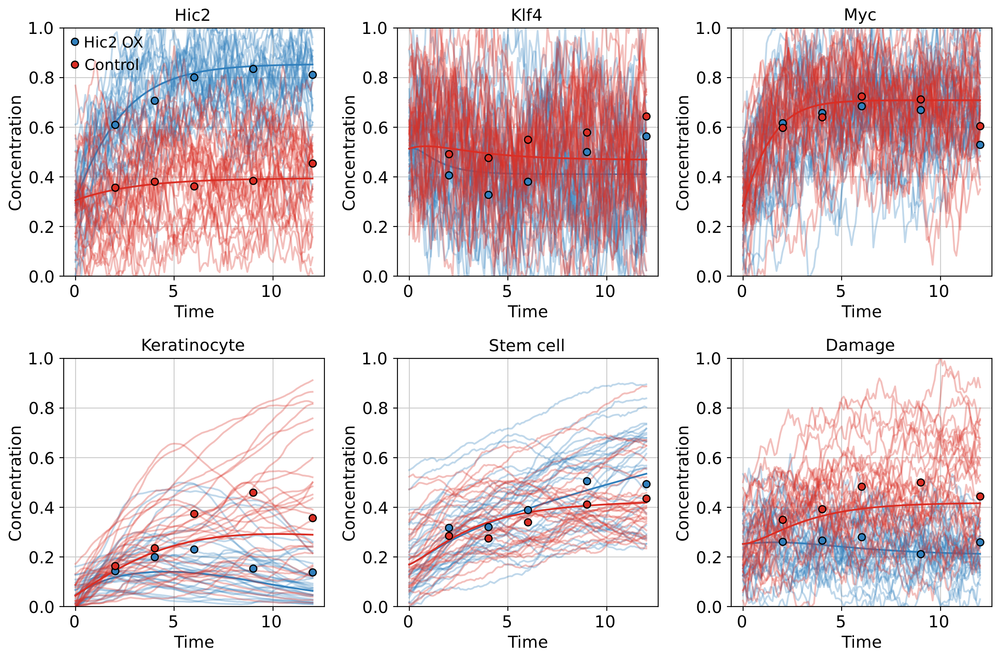

In [32]:
compare_stochastic_trajectories(best_parameters)

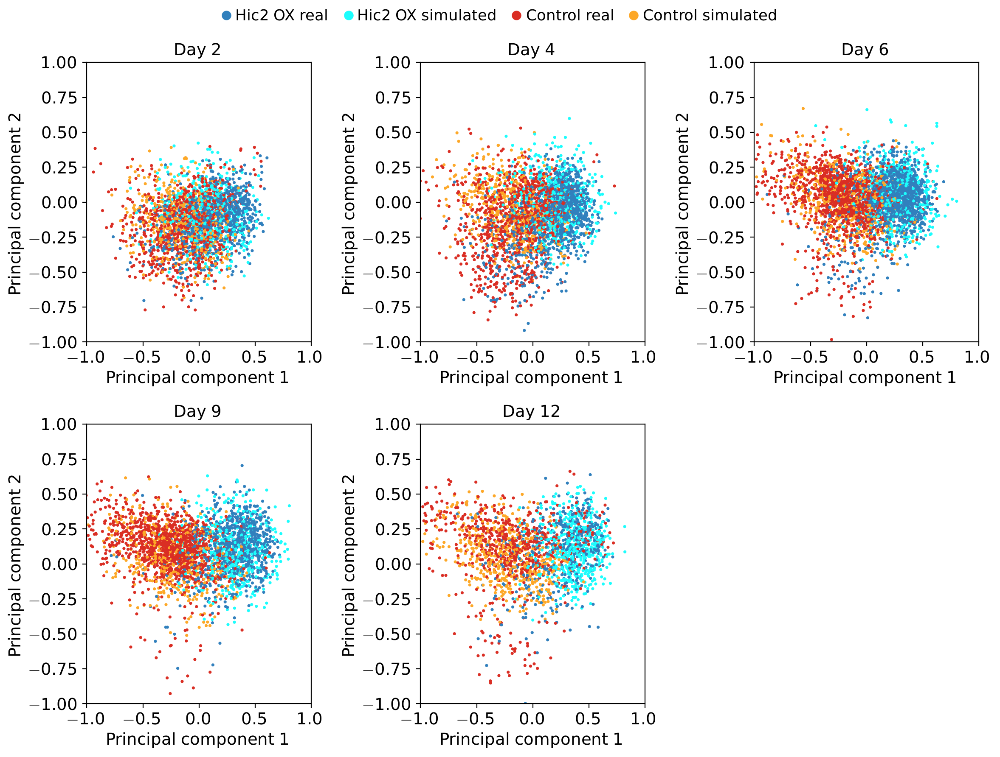

In [33]:
compare_pca(best_parameters)

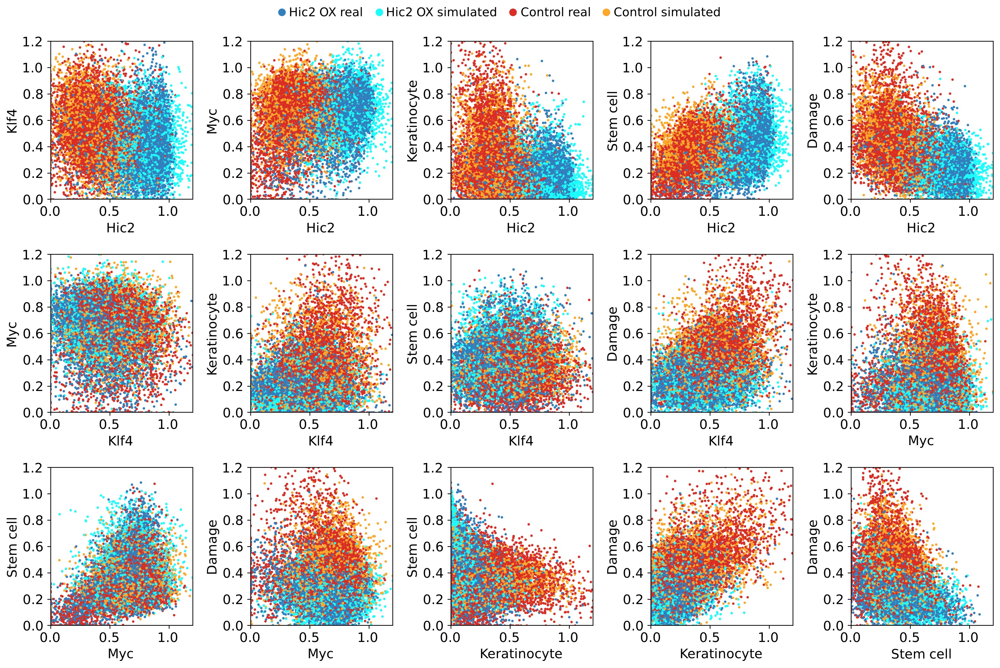

In [34]:
compare_2d(best_parameters, n_columns=5, figure_width=15)

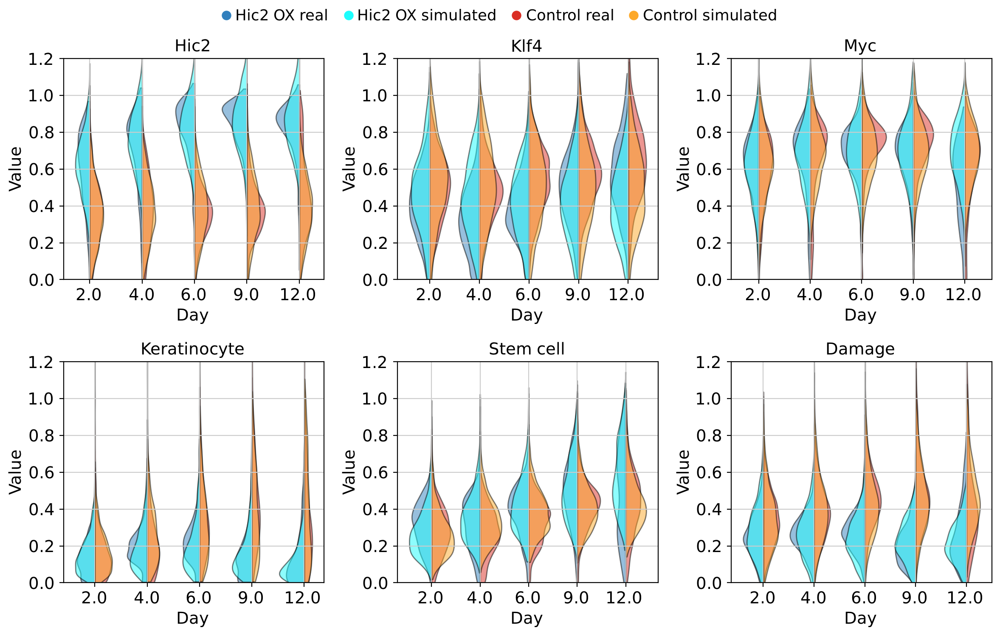

In [35]:
compare_violin(best_parameters)

In [36]:
def reprogramming_results(parameters, n_trajectories=5000, reprogramming_cutoff=0.8, keratinocyte_cutoff=0.7, damage_cutoff=0.85, dt=0.1, seed=0, time_span=[0, 12]):
    keratinocyte_index = 3
    stem_cell_index = 4
    damage_index = 5

    # Generate trajectories
    _, trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=dt, seed=seed, parameters=parameters, n_trajectories=n_trajectories)

    end_points = trajectories[:, :, -1]
    reprogramming_efficiency = (end_points[:, stem_cell_index] > reprogramming_cutoff).sum() / n_trajectories
    keratinocyte_proportion = (end_points[:, keratinocyte_index] > keratinocyte_cutoff).sum() / n_trajectories
    damaged_proportion = (end_points[:, damage_index] > damage_cutoff).sum() / n_trajectories
    return reprogramming_efficiency, keratinocyte_proportion, damaged_proportion

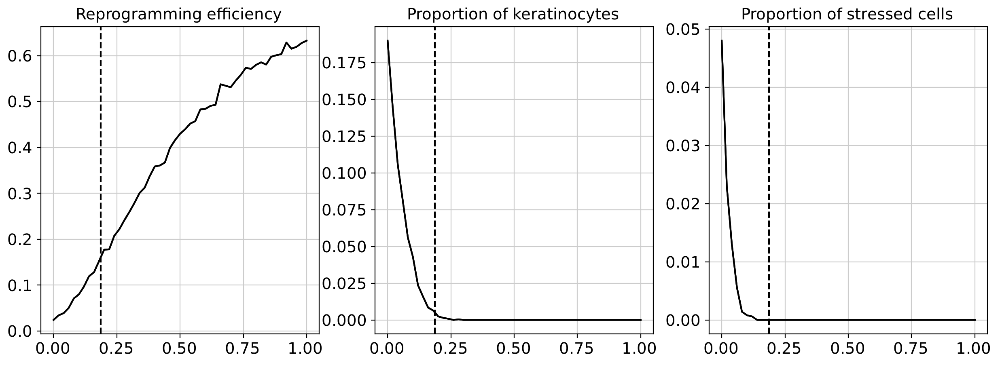

In [37]:
# Efficiency with different levels of Hic2 overexpression

beta_H_array = numpy.arange(0, 1.0+1e-10, 0.02)
results_list = []

seed = 0
iterations = 5
n_trajectories = 1000

for beta_H in beta_H_array:
    parameters = best_parameters.copy()
    parameters[beta_H_index] = beta_H

    total = []

    for i in range(iterations):
        hic2_parameters = best_parameters.copy()
        hic2_parameters[beta_H_index] = beta_H
        efficiency, keratinocyte, damage = reprogramming_results(parameters, seed=seed, n_trajectories=n_trajectories)
        total.append([efficiency, keratinocyte, damage])

        seed += 1
    
    total = numpy.array(total)
    results_list.append(total.mean(axis=0))

results_array = numpy.array(results_list)

figure, axes = pyplot.subplots(1, 3)
figure.set_size_inches(15, 5)
title_list = ["Reprogramming efficiency", "Proportion of keratinocytes", "Proportion of stressed cells"]
for axis_index, axis in enumerate(axes):
    axis.plot(beta_H_array, results_array[:, axis_index], color="black")
    axis.plot(beta_H_array, results_array[:, axis_index], color="black")
    axis.set_title(title_list[axis_index])
    axis.axvline(best_parameters[beta_H_index], linestyle="dashed", color="black")
    axis.grid(True)
pyplot.show()

In [38]:
control_color = adata.uns["group_colors"][2]
hic2_color = adata.uns["group_colors"][3]

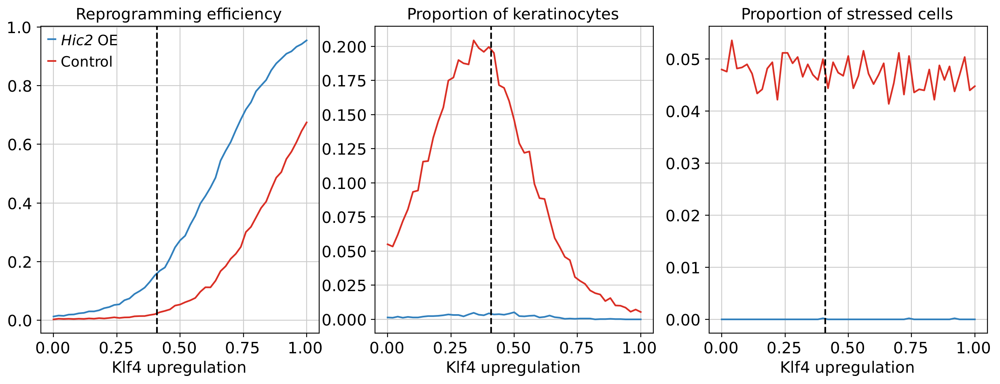

In [39]:
beta_K_index = 7

beta_K_array = numpy.arange(0, 1.0+1e-10, 0.02)
control_results = []
hic2_results = []
n_trajectories = 1000

seed = 0
iterations = 5

for beta_K in beta_K_array:

    hic2_total = []
    control_total = []

    for i in range(iterations):
        hic2_parameters = best_parameters.copy()
        hic2_parameters[beta_K_index] = beta_K
        hic2_efficiency, hic2_keratinocyte, hic2_damage = reprogramming_results(hic2_parameters, seed=seed, n_trajectories=n_trajectories)
        hic2_total.append([hic2_efficiency, hic2_keratinocyte, hic2_damage])

        control_parameters = best_control.copy()
        control_parameters[beta_K_index] = beta_K
        control_efficiency, control_keratinocyte, control_damage = reprogramming_results(control_parameters, seed=seed, n_trajectories=n_trajectories)
        control_total.append([control_efficiency, control_keratinocyte, control_damage])

        seed += 1
    
    hic2_total = numpy.array(hic2_total)
    control_total = numpy.array(control_total)

    hic2_results.append(hic2_total.mean(axis=0))
    control_results.append(control_total.mean(axis=0))

hic2_results = numpy.array(hic2_results)
control_results = numpy.array(control_results)

figure, axes = pyplot.subplots(1, 3)
figure.set_size_inches(15, 5)
title_list = ["Reprogramming efficiency", "Proportion of keratinocytes", "Proportion of stressed cells"]
for axis_index, axis in enumerate(axes):
    axis.plot(beta_K_array, hic2_results[:, axis_index], color=hic2_color, label=r"\textit{Hic2} OE")
    axis.plot(beta_K_array, control_results[:, axis_index], color=control_color, label="Control")
    axis.set_title(title_list[axis_index])
    axis.axvline(best_parameters[beta_K_index], linestyle="dashed", color="black")
    axis.grid(True)
    axis.set_xlabel("Klf4 upregulation")
    if axis_index == 0:
        axis.legend()
pyplot.show()

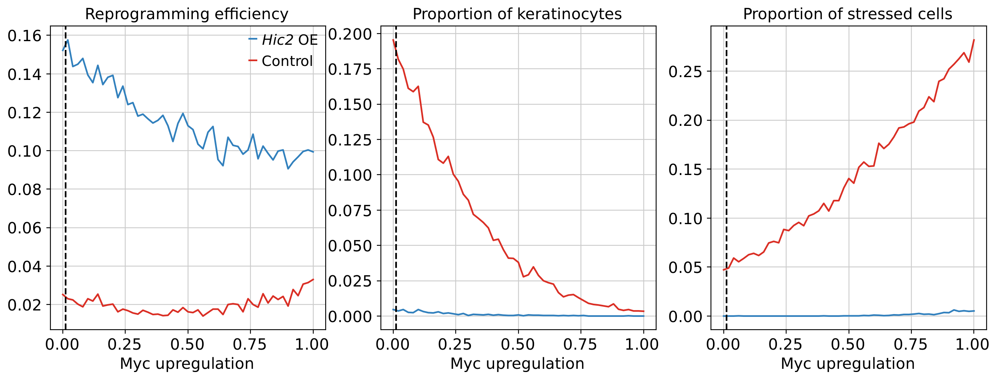

In [40]:
beta_M_index = 8

beta_M_array = numpy.arange(0, 1.0+1e-10, 0.02)
control_results = []
hic2_results = []
n_trajectories = 1000

iterations = 5
seed = 0

for beta_index, beta_M in enumerate(beta_M_array):
    hic2_total = []
    control_total = []

    for i in range(iterations):
        hic2_parameters = best_parameters.copy()
        hic2_parameters[beta_M_index] = beta_M
        hic2_efficiency, hic2_keratinocyte, hic2_damage = reprogramming_results(hic2_parameters, seed=seed, n_trajectories=n_trajectories)
        hic2_total.append([hic2_efficiency, hic2_keratinocyte, hic2_damage])

        control_parameters = best_control.copy()
        control_parameters[beta_M_index] = beta_M
        control_efficiency, control_keratinocyte, control_damage = reprogramming_results(control_parameters, seed=seed, n_trajectories=n_trajectories)
        control_total.append([control_efficiency, control_keratinocyte, control_damage])

        seed += 1
    
    hic2_total = numpy.array(hic2_total)
    control_total = numpy.array(control_total)

    hic2_results.append(hic2_total.mean(axis=0))
    control_results.append(control_total.mean(axis=0))

hic2_results = numpy.array(hic2_results)
control_results = numpy.array(control_results)

figure, axes = pyplot.subplots(1, 3)
figure.set_size_inches(15, 5)
title_list = ["Reprogramming efficiency", "Proportion of keratinocytes", "Proportion of stressed cells"]
for axis_index, axis in enumerate(axes):
    axis.plot(beta_M_array, hic2_results[:, axis_index], color=hic2_color, label=r"\textit{Hic2} OE")
    axis.plot(beta_M_array, control_results[:, axis_index], color=control_color, label="Control")
    axis.set_title(title_list[axis_index])
    axis.axvline(best_parameters[beta_M_index], linestyle="dashed", color="black")
    axis.grid(True)
    axis.set_xlabel("Myc upregulation")
    if axis_index == 0:
        axis.legend()
pyplot.show()